In [2]:
using ITensors
using Distributions
using HDF5
using Random
using Plots
using Plots.PlotMeasures
using MLDataUtils, StatsBase
using DelimitedFiles
include("../SweepOptRegular.jl")

InspectOverlap (generic function with 2 methods)

In [3]:
ecg_dat = readdlm("../ECG200_TRAIN.txt")
X_train = ecg_dat[:, 2:end]
y_train = Int.(ecg_dat[:, 1])
remap = Dict(-1 => 0, 1 => 1)
y_train = [remap[label] for label in y_train];
y_train = reshape(y_train, length(y_train), 1);

In [4]:
ecg_dat_test = readdlm("../ECG200_TEST.txt")
X_test = ecg_dat_test[:, 2:end]
y_test = Int.(ecg_dat_test[:, 1])
y_test = [remap[label] for label in y_test]
y_test = reshape(y_test, length(y_test), 1);

In [5]:
struct RobustSigmoidTransform{T<:Real} <: AbstractDataTransform
    median::T
    iqr::T
    k::T
    positive::Bool

    function RobustSigmoidTransform(median::T, iqr::T, k::T, positive=true) where T<:Real
        new{T}(median, iqr, k, positive)
    end
end

function robust_sigmoid(x::Real, median::Real, iqr::Real, k::Real, positive::Bool)
    xhat = 1.0 / (1.0 + exp(-(x - median) / (iqr / k)))
    if !positive
        xhat = 2*xhat - 1
    end
    return xhat
end

function fitScaler(::Type{RobustSigmoidTransform}, X::Matrix; k::Real=1.35, positive::Bool=true)
    medianX = median(X)
    iqrX = iqr(X)
    return RobustSigmoidTransform(medianX, iqrX, k, positive)
end

function transformData(t::RobustSigmoidTransform, X::Matrix)
    return map(x -> robust_sigmoid(x, t.median, t.iqr, t.k, t.positive), X)
end

# New SigmoidTransform
struct SigmoidTransform <: AbstractDataTransform
    positive::Bool
end

function sigmoid(x::Real, positive::Bool)
    xhat = 1.0 / (1.0 + exp(-x))
    if !positive
        xhat = 2*xhat - 1
    end
    return xhat
end

function fitScaler(::Type{SigmoidTransform}, X::Matrix; positive::Bool=true)
    return SigmoidTransform(positive)
end

function transformData(t::SigmoidTransform, X::Matrix)
    return map(x -> sigmoid(x, t.positive), X)
end;

In [6]:
rst = fitScaler(RobustSigmoidTransform, X_train; positive=true)
X_train_normalised = transformData(rst, X_train)
X_test_normalised = transformData(rst, X_test);

In [7]:
W, sites = fitMPS(X_train_normalised, y_train; χ_max=15, nsweep=10, α=0.01, χ_init=2, random_state=42)

Initialising training states.


Parameters: 
Feature map: AngleEncoder
Initial bond dimension χ_init: 2
Step size α: 0.01
Maximum number of sweeps: 10
Maximum bond dimension χ_max: 15
Generating initial weight MPS with bond dimension χ = 2 using random seed 42.


Forward Sweep L -> R (1/10)


Backward Sweep R -> L (1/10)


Training loss after Sweep 1: 0.320677773782609 | Training Acc: 0.8
ΔC train after sweep 1: 0.17932222621739102
Forward Sweep L -> R (2/10)


Backward Sweep R -> L (2/10)


Training loss after Sweep 2: 0.3296311680303685 | Training Acc: 0.94
ΔC train after sweep 2: -0.008953394247759539
Forward Sweep L -> R (3/10)


Backward Sweep R -> L (3/10)


Training loss after Sweep 3: 0.3346101463002775 | Training Acc: 0.97
ΔC train after sweep 3: -0.004978978269909007
Forward Sweep L -> R (4/10)


Backward Sweep R -> L (4/10)


Training loss after Sweep 4: 0.33489661504470014 | Training Acc: 0.97
ΔC train after sweep 4: -0.0002864687444226188
Forward Sweep L -> R (5/10)


Backward Sweep R -> L (5/10)


Training loss after Sweep 5: 0.3339029217267293 | Training Acc: 0.97
ΔC train after sweep 5: 0.000993693317970834
Forward Sweep L -> R (6/10)


Backward Sweep R -> L (6/10)


Training loss after Sweep 6: 0.3330098779953289 | Training Acc: 0.98
ΔC train after sweep 6: 0.0008930437314004225
Forward Sweep L -> R (7/10)


Backward Sweep R -> L (7/10)


Training loss after Sweep 7: 0.3322407166400918 | Training Acc: 0.98
ΔC train after sweep 7: 0.0007691613552370802
Forward Sweep L -> R (8/10)


Backward Sweep R -> L (8/10)


Training loss after Sweep 8: 0.3315831808704888 | Training Acc: 0.98
ΔC train after sweep 8: 0.0006575357696029793
Forward Sweep L -> R (9/10)


Backward Sweep R -> L (9/10)


Training loss after Sweep 9: 0.33101289985346616 | Training Acc: 0.98
ΔC train after sweep 9: 0.0005702810170226669
Forward Sweep L -> R (10/10)


Backward Sweep R -> L (10/10)


Training loss after Sweep 10: 0.3305346636499325 | Training Acc: 0.98
ΔC train after sweep 10: 0.00047823620353365515


(MPS
[1] ((dim=2|id=943|"S=1/2,Site,n=1"), (dim=2|id=944|"decision"), (dim=4|id=253|"Link,l=1"))
[2] ((dim=2|id=733|"S=1/2,Site,n=2"), (dim=8|id=59|"Link,l=2"), (dim=4|id=253|"Link,l=1"))
[3] ((dim=2|id=623|"S=1/2,Site,n=3"), (dim=15|id=645|"Link,l=3"), (dim=8|id=59|"Link,l=2"))
[4] ((dim=2|id=868|"S=1/2,Site,n=4"), (dim=15|id=112|"Link,l=4"), (dim=15|id=645|"Link,l=3"))
[5] ((dim=2|id=928|"S=1/2,Site,n=5"), (dim=15|id=634|"Link,l=5"), (dim=15|id=112|"Link,l=4"))
[6] ((dim=2|id=487|"S=1/2,Site,n=6"), (dim=15|id=512|"Link,l=6"), (dim=15|id=634|"Link,l=5"))
[7] ((dim=2|id=486|"S=1/2,Site,n=7"), (dim=15|id=149|"Link,l=7"), (dim=15|id=512|"Link,l=6"))
[8] ((dim=2|id=896|"S=1/2,Site,n=8"), (dim=15|id=37|"Link,l=8"), (dim=15|id=149|"Link,l=7"))
[9] ((dim=2|id=809|"S=1/2,Site,n=9"), (dim=15|id=404|"Link,l=9"), (dim=15|id=37|"Link,l=8"))
[10] ((dim=2|id=382|"S=1/2,Site,n=10"), (dim=15|id=306|"Link,l=10"), (dim=15|id=404|"Link,l=9"))
[11] ((dim=2|id=303|"S=1/2,Site,n=11"), (dim=15|id=745|"Link,

In [15]:
ScoreMPS(W, X_test_normalised, y_test)

Initialising testing states.


Test loss: 0.35429153863957297 | Test Accuracy: 0.92


2-element Vector{Float64}:
 0.35429153863957297
 0.92

In [50]:
mps_state_0 = deepcopy(W);

In [51]:
norm(mps_state_0)

1.0000000000000033

In [52]:
decision_idx = findindex(mps_state_0[1], "decision")

(dim=2|id=869|"decision")

In [53]:
decision_state_0 = onehot(decision_idx => (1))

ITensor ord=1 (dim=2|id=869|"decision")
NDTensors.Dense{Float64, Vector{Float64}}

In [54]:
mps_state_0[1] *= decision_state_0

ITensor ord=2 (dim=2|id=794|"S=1/2,Site,n=1") (dim=4|id=632|"Link,l=1")
NDTensors.Dense{Float64, Vector{Float64}}

In [55]:
normalize!(mps_state_0)

MPS
[1] ((dim=2|id=794|"S=1/2,Site,n=1"), (dim=4|id=632|"Link,l=1"))
[2] ((dim=2|id=987|"S=1/2,Site,n=2"), (dim=8|id=315|"Link,l=2"), (dim=4|id=632|"Link,l=1"))
[3] ((dim=2|id=984|"S=1/2,Site,n=3"), (dim=15|id=855|"Link,l=3"), (dim=8|id=315|"Link,l=2"))
[4] ((dim=2|id=482|"S=1/2,Site,n=4"), (dim=15|id=343|"Link,l=4"), (dim=15|id=855|"Link,l=3"))
[5] ((dim=2|id=446|"S=1/2,Site,n=5"), (dim=15|id=758|"Link,l=5"), (dim=15|id=343|"Link,l=4"))
[6] ((dim=2|id=911|"S=1/2,Site,n=6"), (dim=15|id=569|"Link,l=6"), (dim=15|id=758|"Link,l=5"))
[7] ((dim=2|id=631|"S=1/2,Site,n=7"), (dim=15|id=182|"Link,l=7"), (dim=15|id=569|"Link,l=6"))
[8] ((dim=2|id=500|"S=1/2,Site,n=8"), (dim=15|id=667|"Link,l=8"), (dim=15|id=182|"Link,l=7"))
[9] ((dim=2|id=466|"S=1/2,Site,n=9"), (dim=15|id=47|"Link,l=9"), (dim=15|id=667|"Link,l=8"))
[10] ((dim=2|id=223|"S=1/2,Site,n=10"), (dim=15|id=97|"Link,l=10"), (dim=15|id=47|"Link,l=9"))
[11] ((dim=2|id=258|"S=1/2,Site,n=11"), (dim=15|id=136|"Link,l=11"), (dim=15|id=97|"Link

In [22]:
training_sample = X_train_normalised[1, :];

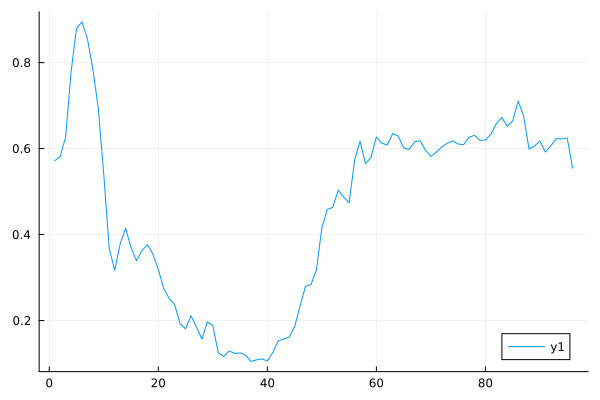

In [23]:
plot(training_sample)

Now let's select site 6 to measure once again...

In [24]:
function GenerateSingleProductState(normalised_sample::Vector, site_inds)

    """Convert a single normalised sample to a product state with local dimension defined by the feature map."""

    N_sites = size(training_sample)[1]
    feature_map = AngleEncoder
    d = 2

    product_state = MPS(site_inds; linkdims=1)

    if N_sites !== size(normalised_sample)[1]
        error("Number of MPS sites (N = $N_sites) does not match the length of the time-series sample (N = $(size(normalised_sample)[1])).")
    end

    for j=1:N_sites
        T = ITensor(site_inds[j])
        mapped_vals = feature_map(normalised_sample[j])
        if length(mapped_vals) == d
            if length(mapped_vals) == 2
                up_val, down_val = mapped_vals
                T[1] = down_val
                T[2] = up_val
            elseif length(mapped_vals) == 3
                up_val, zero_val, down_val = mapped_vals
                T[1] = down_val
                T[2] = zero_val
                T[3] = up_val
            else
                error("Feature map output dimension incorrect.")
            end
        else
            error("Feature map dimension does match site indices dimension.")
        end
        product_state[j] = T
    end
    return product_state
end

GenerateSingleProductState (generic function with 1 method)

In [25]:
ϕ = GenerateSingleProductState(training_sample, sites);

In [27]:
@show ϕ[6]

ϕ[6] = ITensor ord=1
Dim 1: (dim=2|id=911|"S=1/2,Site,n=6")
NDTensors.Dense{Float64, Vector{Float64}}
 2-element
 0.9863022111052755
 0.16494832029713027


ITensor ord=1 (dim=2|id=911|"S=1/2,Site,n=6")
NDTensors.Dense{Float64, Vector{Float64}}

In [29]:
# construct projector
projector_site_6 = Vector(ϕ[6]) * Vector(ϕ[6])'
projector_site_6_operator = op(projector_site_6, sites[6])

ITensor ord=2 (dim=2|id=911|"S=1/2,Site,n=6")' (dim=2|id=911|"S=1/2,Site,n=6")
NDTensors.Dense{Float64, Vector{Float64}}

Now let's get the entanglement entropy before making the measurment, we will call this $S_6$ - that is, the entanglement entropy of the MPS before having measured qubit 6. We will get the entanglement entropy for each site, except site 6.

In [30]:
function entropy_von_neumann(psi::MPS, b::Int, sites)
    s = sites
    orthogonalize!(psi, b) # change orthogonality center to site B
    if b == 1
        _, S = svd(psi[b], (siteind(psi, b),))
    else
        _, S = svd(psi[b], (linkind(psi, b-1), s[b]))
    end
    SvN = 0.0
    for n in 1:ITensors.dim(S, 1)
        p = S[n, n]^2
        SvN -= p * log(p)
    end

    return SvN
end

entropy_von_neumann (generic function with 1 method)

In [35]:
S_6_allSites = [entropy_von_neumann(mps_state_0, b, sites) for b=1:length(mps_state_0) if b != 6];

Now let's get the entanglement entopy after making the meaasurement. We will call this $S'_6$.

In [37]:
new_site_6 = projector_site_6_operator * mps_state_0[6]
noprime!(new_site_6)

ITensor ord=3 (dim=2|id=911|"S=1/2,Site,n=6") (dim=15|id=540|"Link,l=5") (dim=15|id=31|"Link,l=6")
NDTensors.Dense{Float64, Vector{Float64}}

In [38]:
mps_state_0[6] = new_site_6

ITensor ord=3 (dim=2|id=911|"S=1/2,Site,n=6") (dim=15|id=540|"Link,l=5") (dim=15|id=31|"Link,l=6")
NDTensors.Dense{Float64, Vector{Float64}}

In [39]:
normalize!(mps_state_0)

MPS
[1] ((dim=2|id=794|"S=1/2,Site,n=1"), (dim=2|id=495|"Link,l=1"))
[2] ((dim=2|id=987|"S=1/2,Site,n=2"), (dim=2|id=495|"Link,l=1"), (dim=4|id=171|"Link,l=2"))
[3] ((dim=2|id=984|"S=1/2,Site,n=3"), (dim=4|id=171|"Link,l=2"), (dim=8|id=823|"Link,l=3"))
[4] ((dim=2|id=482|"S=1/2,Site,n=4"), (dim=8|id=823|"Link,l=3"), (dim=15|id=97|"Link,l=4"))
[5] ((dim=2|id=446|"S=1/2,Site,n=5"), (dim=15|id=97|"Link,l=4"), (dim=15|id=540|"Link,l=5"))
[6] ((dim=2|id=911|"S=1/2,Site,n=6"), (dim=15|id=540|"Link,l=5"), (dim=15|id=31|"Link,l=6"))
[7] ((dim=2|id=631|"S=1/2,Site,n=7"), (dim=15|id=31|"Link,l=6"), (dim=15|id=306|"Link,l=7"))
[8] ((dim=2|id=500|"S=1/2,Site,n=8"), (dim=15|id=306|"Link,l=7"), (dim=15|id=591|"Link,l=8"))
[9] ((dim=2|id=466|"S=1/2,Site,n=9"), (dim=15|id=591|"Link,l=8"), (dim=15|id=302|"Link,l=9"))
[10] ((dim=2|id=223|"S=1/2,Site,n=10"), (dim=15|id=302|"Link,l=9"), (dim=15|id=840|"Link,l=10"))
[11] ((dim=2|id=258|"S=1/2,Site,n=11"), (dim=15|id=840|"Link,l=10"), (dim=15|id=500|"Link,l

In [40]:
norm(mps_state_0)

0.999999999999998

In [41]:
S_6_prime_allSites = [entropy_von_neumann(mps_state_0, b, sites) for b=1:length(mps_state_0) if b != 6];

In [42]:
S_6_allSites

95-element Vector{Float64}:
  0.11355204084697529
  0.28449688252764055
  0.428081748716552
  0.5275786003021979
  0.6169657610016956
  0.8344508534890673
  0.9273506868415811
  1.029465673079599
  1.0802870388127894
  1.1360984539305699
  ⋮
  0.6168425118747327
  0.5961456945496785
  0.5476249044756245
  0.5047878524859886
  0.45341085086260735
  0.35039860940099316
  0.24085027975207146
  0.08623353414858137
 -5.7731597280508306e-15

The average variation of the EE after the measurement is given by:
$$\langle \delta S \rangle = \frac{\sum_{m \neq m'} (S'_m - S_m)}{M-1}$$
Where $M$ is the number of qubits in the MPS chain.

In [48]:
diff_S = S_6_prime_allSites .- S_6_allSites
sum_diff_S = sum(diff_S)
average_variation = sum_diff_S / (length(mps_state_0) - 1)

-0.07413317037505039

We obtain a negative value, so on average, the entanglement entropy of the final state is smaller than the initial state. This is to be expected, since when making the measurement, we extract some information from the system and reduce the entanglement entropy relative to the intial state.

# Repeating for the entire sample

Let's now convert this all to a function and do this for each feature in the time-series sample.

In [1]:
function ComputeAverageVariation(site_id::Int, init_state::MPS, ϕ::MPS, sites)
    state_before_measurment = deepcopy(init_state)
    # start by computing the EE of the un-measured MPS
    S_site_allSites = [entropy_von_neumann(state_before_measurment, b, sites) for b=1:length(state_before_measurment) if b != site_id];
    # construct projector for measuring at site_id
    projector_site = Vector(ϕ[site_id]) * Vector(ϕ[site_id])'
    projector_site_operator = op(projector_site, sites[site_id])
    new_site = projector_site_operator * state_before_measurment[site_id]
    noprime!(new_site)
    state_before_measurment[site_id] = new_site
    normalize!(state_before_measurment)
    S_site_prime_allSites = [entropy_von_neumann(state_before_measurment, b, sites) for b=1:length(state_before_measurment) if b != site_id];
    diff_S = S_site_prime_allSites .- S_site_allSites
    sum_diff_S = sum(diff_S)
    average_variation = sum_diff_S / (length(state_before_measurment) - 1)
    return average_variation
end

UndefVarError: UndefVarError: `MPS` not defined

In [75]:
average_variations_all = [ComputeAverageVariation(i, mps_state_0, ϕ, sites) for i=1:length(mps_state_0)]

96-element Vector{Float64}:
  0.0008438680012057811
  0.002913697568342576
 -0.022701519851804314
 -0.0409949811394141
 -0.07480861118132533
 -0.07413317037504932
 -0.03899044645371034
 -0.021316130310512903
 -0.01590594526060774
 -0.006057973014150627
  ⋮
 -0.007500377909791872
 -0.007206991368827075
 -0.019488777372754645
 -0.022637304464115486
 -0.028951901682163987
 -0.027816103931354107
 -0.021796416409482468
 -0.043544209942794634
 -0.020952563949041485

In [77]:
argmax(average_variations_all)

35

In [78]:
argmin(average_variations_all)

5

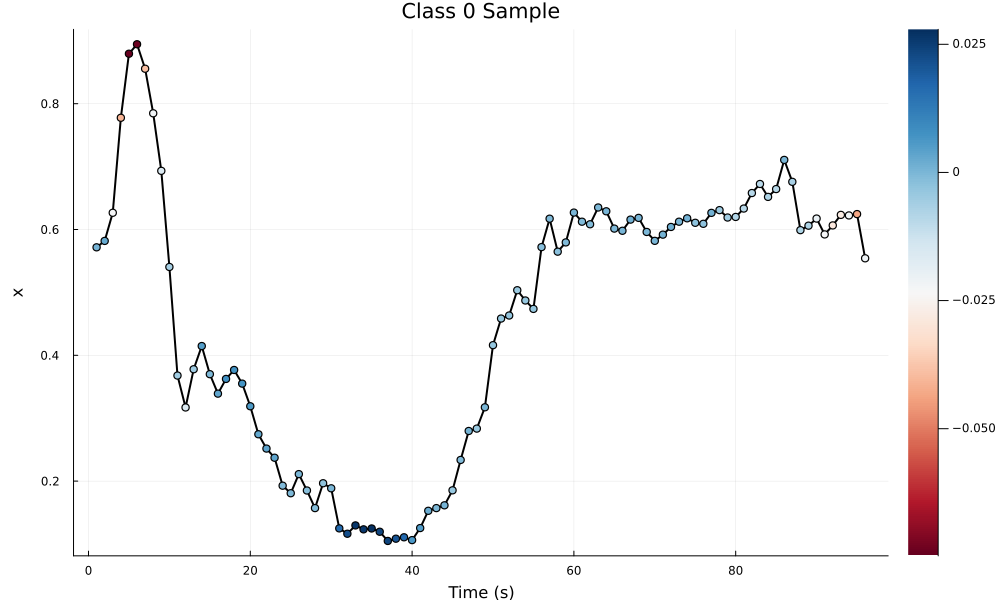

In [127]:
plot(training_sample, color=:black, linewidth=2, label="")
scatter!(training_sample, marker_z=average_variations_all, size=(1000, 600), colormap=:RdBu, ms=4, left_margin=5mm, label="")
title!("Class 0 Sample")
xlabel!("Time (s)")
ylabel!("x")

Alternative visualisation:

In [135]:
cmax = maximum(abs.(average_variations_all))

0.07480861118132533

In [141]:
using LaTeXStrings

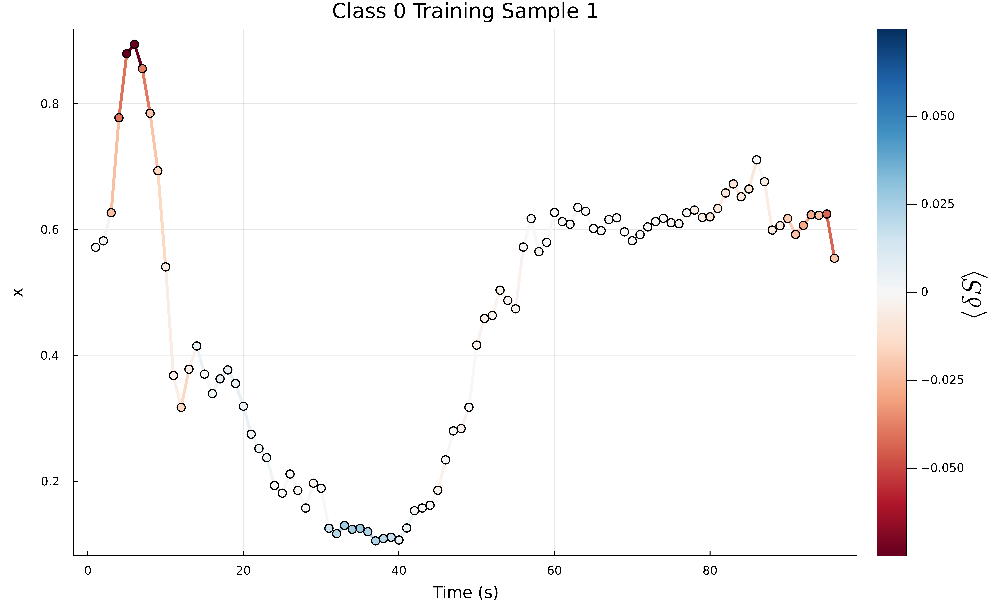

In [159]:
plot(training_sample, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_all, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample, 
    marker_z=average_variations_all,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 0 Training Sample 1")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-0-sample-1.png")


In [165]:
training_sample_2 = X_train_normalised[3, :]
ϕ2 = GenerateSingleProductState(training_sample_2, sites);

In [179]:
mps_state_0 = deepcopy(W);
decision_idx = findindex(mps_state_0[1], "decision")
decision_state_0 = onehot(decision_idx => (1))
mps_state_0[1] *= decision_state_0
normalize!(mps_state_0);

In [180]:
average_variations_sample_2 = [ComputeAverageVariation(i, mps_state_0, ϕ2, sites) for i=1:length(mps_state_0)]

96-element Vector{Float64}:
   0.008607413429567348
 NaN
  -0.011480718584235227
  -0.028689968653679856
  -0.06387131023375078
  -0.06368767318123128
  -0.03603058729821395
  -0.023117161446563565
  -0.018171356691140873
  -0.005593224181603946
   ⋮
  -0.007500525906392008
  -0.008599277535239463
  -0.02146511485596603
  -0.022291490280936774
  -0.02640500058784979
  -0.025595280209529968
  -0.02190227372419928
  -0.04629616091492699
  -0.024068825542191752

There is a NaN in position 2, which we will replace with a zero.

In [182]:
replace!(average_variations_sample_2, NaN => 0.0)

96-element Vector{Float64}:
  0.008607413429567348
  0.0
 -0.011480718584235227
 -0.028689968653679856
 -0.06387131023375078
 -0.06368767318123128
 -0.03603058729821395
 -0.023117161446563565
 -0.018171356691140873
 -0.005593224181603946
  ⋮
 -0.007500525906392008
 -0.008599277535239463
 -0.02146511485596603
 -0.022291490280936774
 -0.02640500058784979
 -0.025595280209529968
 -0.02190227372419928
 -0.04629616091492699
 -0.024068825542191752

In [217]:
cmax = maximum(abs.(average_variations_sample_2))

0.06387131023375078

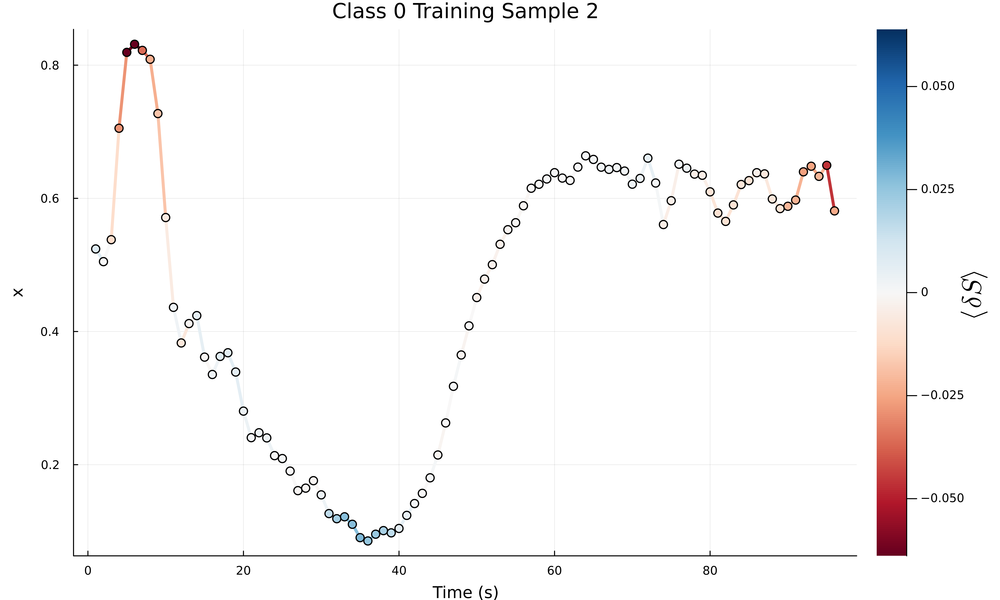

In [220]:
plot(training_sample_2, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_2, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_2, 
    marker_z=average_variations_sample_2,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 0 Training Sample 2")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-0-sample-2.png")

In [187]:
mps_state_0 = deepcopy(W);
decision_idx = findindex(mps_state_0[1], "decision")
decision_state_0 = onehot(decision_idx => (1))
mps_state_0[1] *= decision_state_0
normalize!(mps_state_0);

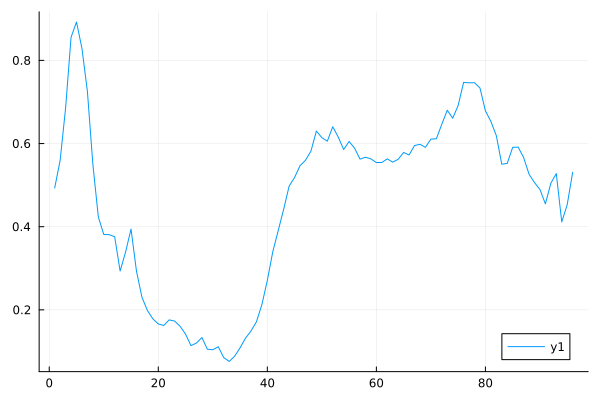

In [201]:
plot(X_train_normalised[98, :])

In [202]:
training_sample_3 = X_train_normalised[98, :]
ϕ3 = GenerateSingleProductState(training_sample_3, sites);

In [203]:
average_variations_sample_3 = [ComputeAverageVariation(i, mps_state_0, ϕ3, sites) for i=1:length(mps_state_0)]

96-element Vector{Float64}:
  0.013660929914042025
  0.006267167717896852
 -0.03082279264959049
 -0.05474836719551649
 -0.07715940697425648
 -0.06326791645202927
 -0.02888979822651824
 -0.01154092376654201
 -0.013647077309684685
 -0.011815458490245463
  ⋮
 -0.0074725159459465085
 -0.014139427451923474
 -0.029384393905234993
 -0.03410418799197051
 -0.0382884807081766
 -0.03740306299632614
 -0.02319137536954651
 -0.025383379846321035
 -0.018231450064080716

In [221]:
cmax = maximum(abs.(average_variations_sample_3))

0.07715940697425648

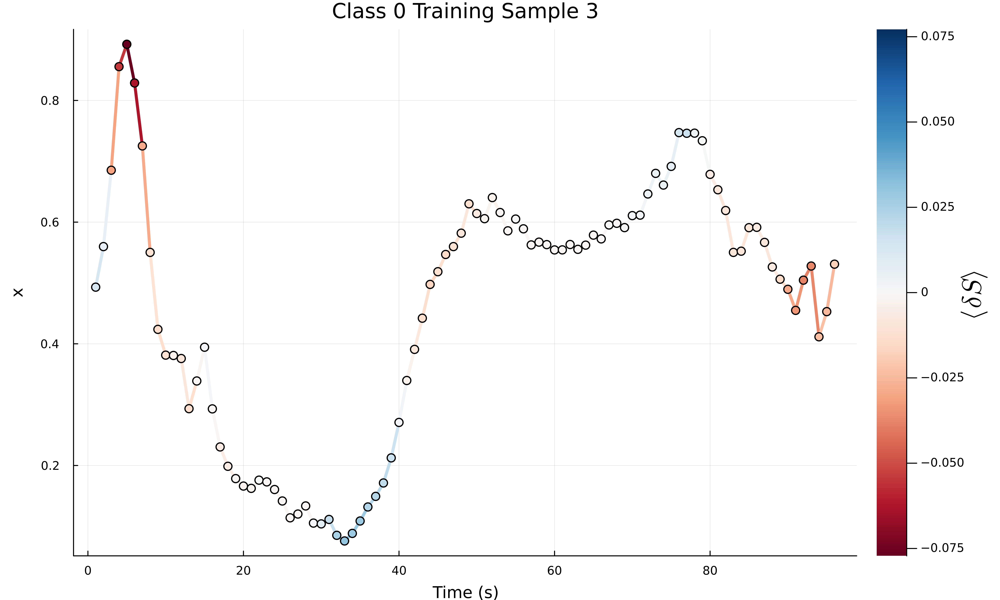

In [224]:
plot(training_sample_3, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_3, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_3, 
    marker_z=average_variations_sample_3,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 0 Training Sample 3")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-0-sample-3.png")

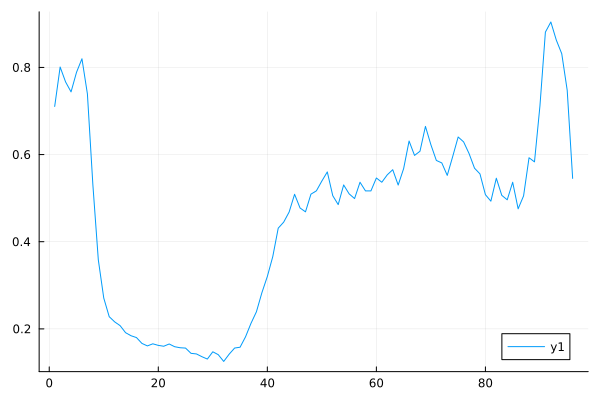

In [212]:
plot(X_train_normalised[19, :])

In [213]:
mps_state_0 = deepcopy(W);
decision_idx = findindex(mps_state_0[1], "decision")
decision_state_0 = onehot(decision_idx => (1))
mps_state_0[1] *= decision_state_0
normalize!(mps_state_0);

In [214]:
training_sample_4 = X_train_normalised[19, :]
ϕ4 = GenerateSingleProductState(training_sample_4, sites);

In [215]:
average_variations_sample_4 = [ComputeAverageVariation(i, mps_state_0, ϕ4, sites) for i=1:length(mps_state_0)]

96-element Vector{Float64}:
 -0.022122157723955444
 -0.03372315706125864
 -0.042851547644386874
 -0.03519634578779653
 -0.05835871880687393
 -0.061890247265170145
 -0.02980209334738559
 -0.011248056048424587
 -0.016617038912757703
 -0.019216052132220805
  ⋮
 -0.007489686838100749
 -0.008686849941463546
 -0.014264906705190344
 -0.012721513796806975
 -0.01386807776697017
 -0.01111899685753613
 -0.02720154727250436
 -0.05760819497350977
 -0.019915341907829964

In [225]:
cmax = maximum(abs.(average_variations_sample_4))

0.061890247265170145

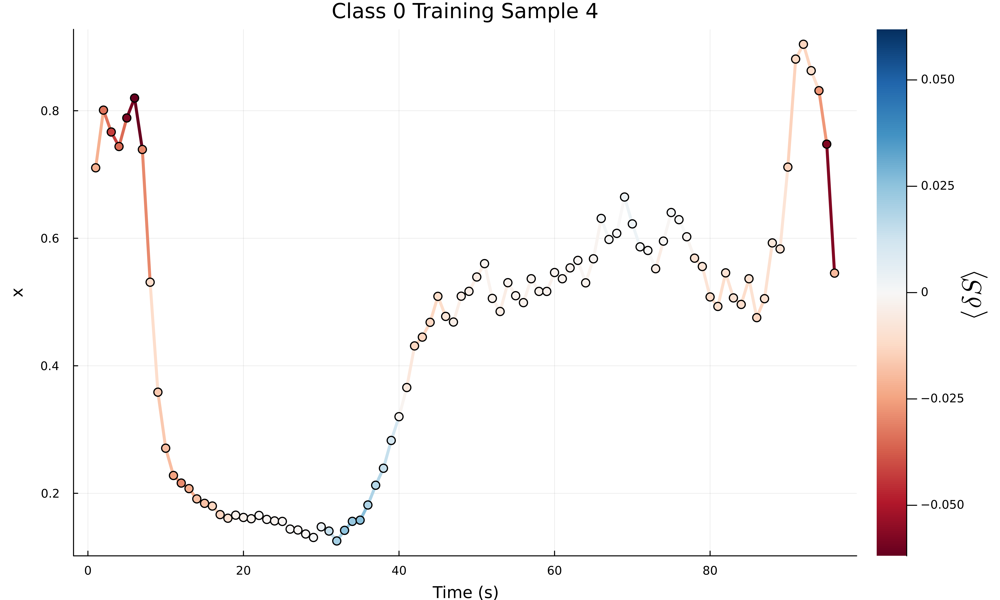

In [228]:
plot(training_sample_4, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_4, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_4, 
    marker_z=average_variations_sample_4,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 0 Training Sample 4")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-0-sample-4.png")

### Class 1 Examples

In [328]:
findall(x -> x.== 1, y_train[:, 1])

69-element Vector{Int64}:
   2
   5
   6
   9
  10
  11
  12
  13
  14
  16
   ⋮
  83
  88
  90
  92
  93
  95
  96
  99
 100

In [329]:
mps_state_0 = deepcopy(W);
decision_idx = findindex(mps_state_0[1], "decision")
decision_state_0 = onehot(decision_idx => (1))
mps_state_0[1] *= decision_state_0
normalize!(mps_state_0);

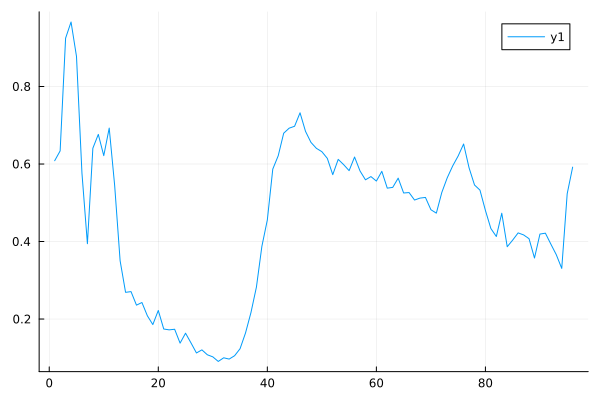

In [412]:
plot(X_train_normalised[5,:])

In [332]:
training_sample_5 = X_train_normalised[5, :]
ϕ5 = GenerateSingleProductState(training_sample_5, sites);

In [333]:
average_variations_sample_5 = [ComputeAverageVariation(i, mps_state_0, ϕ5, sites) for i=1:length(mps_state_0)]

96-element Vector{Float64}:
 -0.005159853203568646
 -0.005195215436981959
 -0.06859508208290127
 -0.07509930640241097
 -0.07443765346077275
 -0.029888690632557398
 -0.016433120864440244
 -0.013874895278200296
 -0.014986441192295436
 -0.0053319714484214
  ⋮
 -0.007881131243127212
 -0.02719786439529859
 -0.03641050889575182
 -0.03767149937408829
 -0.05182889777505771
 -0.058668438277024886
 -0.025813293650395794
 -0.03276529441595027
 -0.025313682516076116

In [334]:
replace!(average_variations_sample_5, NaN => 0.0)

96-element Vector{Float64}:
 -0.005159853203568646
 -0.005195215436981959
 -0.06859508208290127
 -0.07509930640241097
 -0.07443765346077275
 -0.029888690632557398
 -0.016433120864440244
 -0.013874895278200296
 -0.014986441192295436
 -0.0053319714484214
  ⋮
 -0.007881131243127212
 -0.02719786439529859
 -0.03641050889575182
 -0.03767149937408829
 -0.05182889777505771
 -0.058668438277024886
 -0.025813293650395794
 -0.03276529441595027
 -0.025313682516076116

In [335]:
cmax = maximum(abs.(average_variations_sample_5))

0.07509930640241097

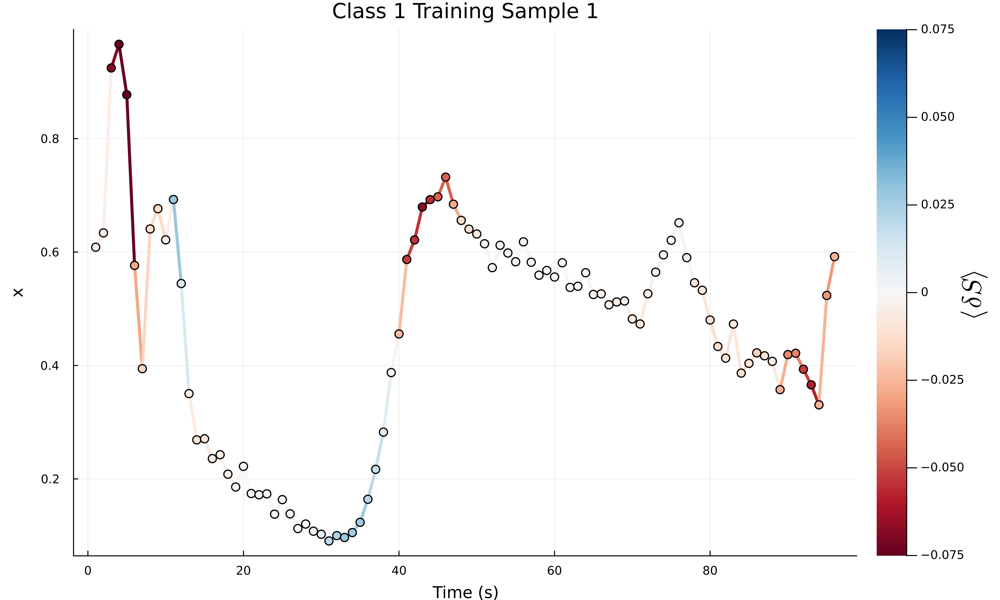

In [338]:
plot(training_sample_5, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_5, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_5, 
    marker_z=average_variations_sample_5,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 1 Training Sample 1")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-1-sample-1.png")

In [339]:
mps_state_0 = deepcopy(W);
decision_idx = findindex(mps_state_0[1], "decision")
decision_state_0 = onehot(decision_idx => (1))
mps_state_0[1] *= decision_state_0
normalize!(mps_state_0);

In [341]:
training_sample_6 = X_train_normalised[9, :]
ϕ6 = GenerateSingleProductState(training_sample_6, sites);

In [342]:
average_variations_sample_6 = [ComputeAverageVariation(i, mps_state_0, ϕ6, sites) for i=1:length(mps_state_0)]

96-element Vector{Float64}:
  0.008127263063425434
 -0.022120253066004857
 -0.06810455759550806
 -0.06050913978623
 -0.06226879237632566
 -0.011019812403118338
 -0.022702002061699922
 -0.013596349658116777
 -0.013783423677102316
 -0.008702522433467115
  ⋮
 -0.00760133454034152
 -0.020471609492546606
 -0.030956627639497157
 -0.03380062579346097
 -0.04733608880579212
 -0.048805152366615305
 -0.022541247579531482
 -0.030402006599080517
 -0.015064122505787762

In [343]:
cmax = maximum(abs.(average_variations_sample_6))

0.07471648238231204

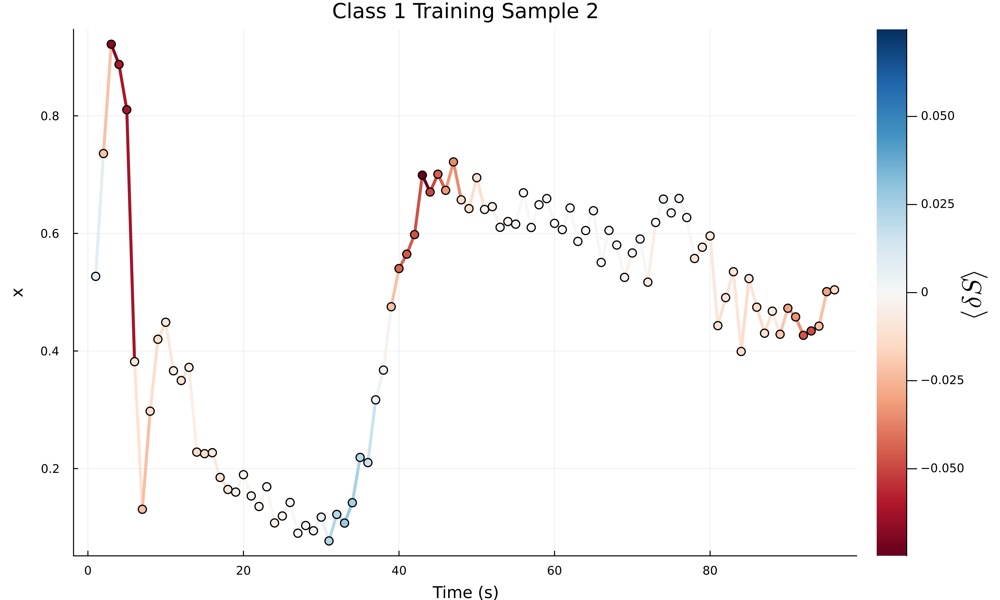

In [346]:
plot(training_sample_6, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_6, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_6, 
    marker_z=average_variations_sample_6,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 1 Training Sample 2")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-1-sample-2.png")

In [347]:
mps_state_0 = deepcopy(W);
decision_idx = findindex(mps_state_0[1], "decision")
decision_state_0 = onehot(decision_idx => (1))
mps_state_0[1] *= decision_state_0
normalize!(mps_state_0);

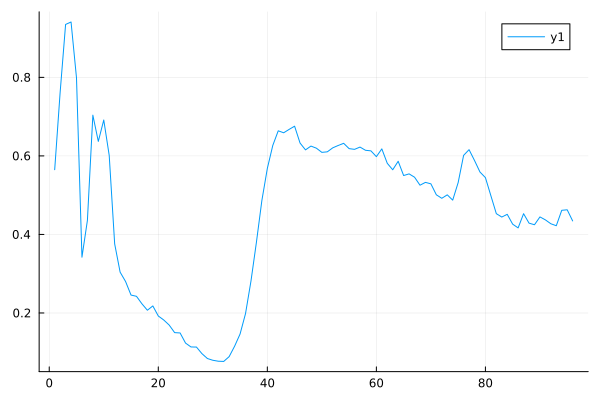

In [348]:
plot(X_train_normalised[25,:])

In [351]:
training_sample_7 = X_train_normalised[25, :]
ϕ7 = GenerateSingleProductState(training_sample_7, sites);

In [352]:
average_variations_sample_7 = [ComputeAverageVariation(i, mps_state_0, ϕ7, sites) for i=1:length(mps_state_0)]

96-element Vector{Float64}:
 NaN
  -0.026661496507067697
  -0.07034274972916682
  -0.07035565610520537
  -0.06015447268236741
  -0.007981745258200395
  -0.017059648259914087
  -0.016500530836856004
  -0.013299420727293256
  -0.006148413144626528
   ⋮
  -0.007763859621546744
  -0.020806341079664416
  -0.03372768088393924
  -0.03596945769875874
  -0.047265066241085625
  -0.050422274897167836
  -0.022221206275741406
  -0.026412666978237232
  -0.006613398882075682

In [353]:
replace!(average_variations_sample_7, NaN => 0.0)

96-element Vector{Float64}:
  0.0
 -0.026661496507067697
 -0.07034274972916682
 -0.07035565610520537
 -0.06015447268236741
 -0.007981745258200395
 -0.017059648259914087
 -0.016500530836856004
 -0.013299420727293256
 -0.006148413144626528
  ⋮
 -0.007763859621546744
 -0.020806341079664416
 -0.03372768088393924
 -0.03596945769875874
 -0.047265066241085625
 -0.050422274897167836
 -0.022221206275741406
 -0.026412666978237232
 -0.006613398882075682

In [354]:
cmax = maximum(abs.(average_variations_sample_7))

0.07035565610520537

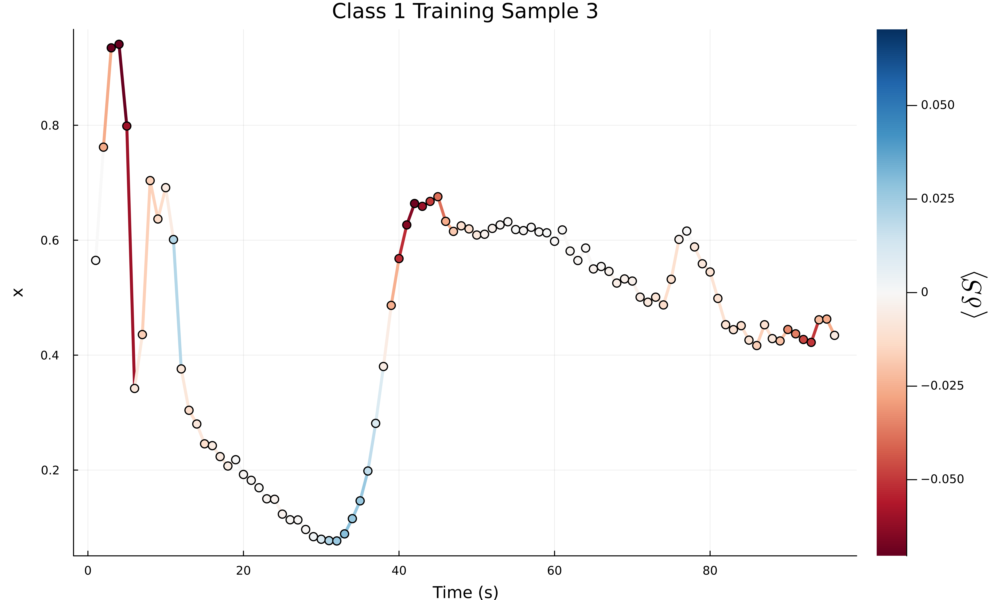

In [357]:
plot(training_sample_7, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_7, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_7, 
    marker_z=average_variations_sample_7,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 1 Training Sample 3")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-1-sample-3.png")

In [369]:
mps_state_0 = deepcopy(W);
decision_idx = findindex(mps_state_0[1], "decision")
decision_state_0 = onehot(decision_idx => (1))
mps_state_0[1] *= decision_state_0
normalize!(mps_state_0);

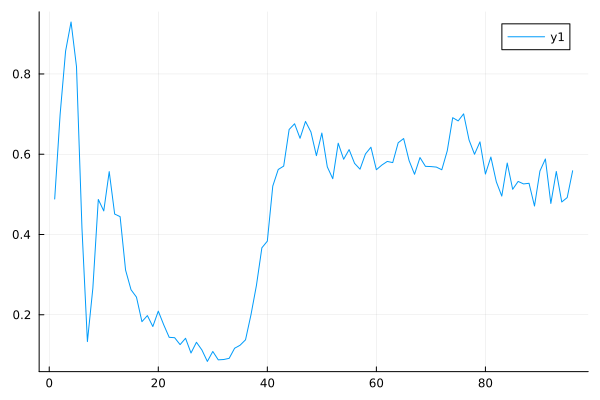

In [370]:
plot(X_train_normalised[99,:])

In [371]:
training_sample_8 = X_train_normalised[99, :]
ϕ8 = GenerateSingleProductState(training_sample_8, sites);

In [372]:
average_variations_sample_8 = [ComputeAverageVariation(i, mps_state_0, ϕ8, sites) for i=1:length(mps_state_0)]

96-element Vector{Float64}:
  0.014436527115742793
 -0.01596934378197087
 -0.0571784140002093
 -0.06822852440963244
 -0.06366251202318736
 -0.013906991201698221
 -0.022522639845345704
 -0.014907864475038472
 -0.012027705476288156
 -0.00832996048550334
  ⋮
 -0.0074712152732659045
 -0.016902334263916408
 -0.023658784616765304
 -0.022910649259955132
 -0.04124652469044768
 -0.03427197292610471
 -0.021958835682182404
 -0.029468827026104177
 -0.021486846578660675

In [373]:
cmax = maximum(abs.(average_variations_sample_8))

0.06822852440963244

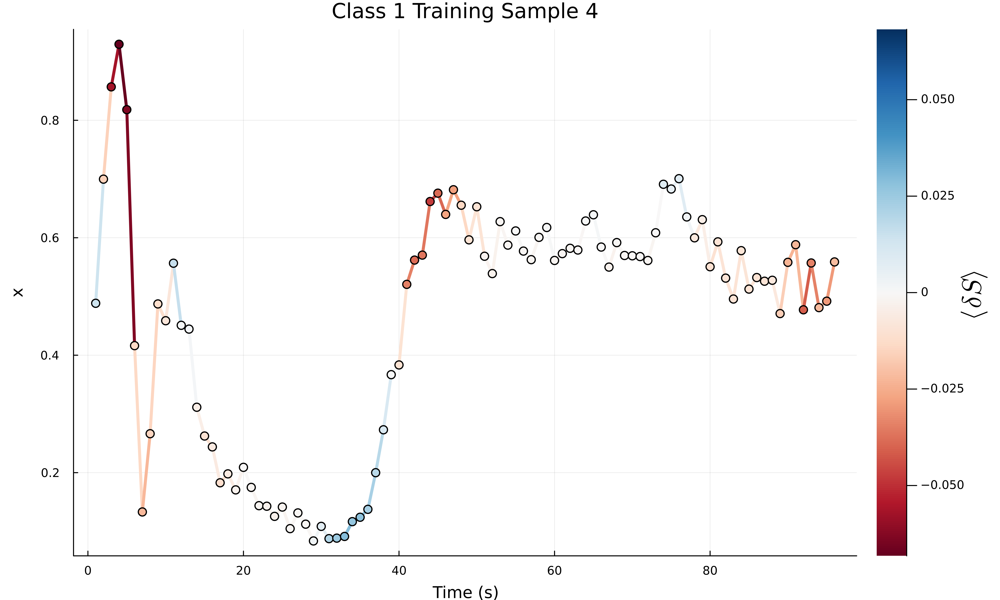

In [376]:
plot(training_sample_8, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_8, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_8, 
    marker_z=average_variations_sample_8,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 1 Training Sample 4")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-1-sample-4.png")

# Repeating For MPS Class 1 State

In [377]:
mps_state_1 = deepcopy(W);
decision_idx = findindex(mps_state_1[1], "decision")
decision_state_1 = onehot(decision_idx => (2))
mps_state_1[1] *= decision_state_1
normalize!(mps_state_1);

In [378]:
training_sample_1 = X_train_normalised[1, :]
ϕ1 = GenerateSingleProductState(training_sample_1, sites);

In [379]:
average_variations_sample_1 = [ComputeAverageVariation(i, mps_state_1, ϕ1, sites) for i=1:length(mps_state_1)]

96-element Vector{Float64}:
  -0.008289199307677967
  -0.013633197930933226
  -0.018244292978171022
  -0.013706738829571598
  -0.003457605305212377
   0.019006747195528115
   0.03176923753034057
   0.01884666730699291
  -0.0167685447100326
  -0.013769029461469132
   ⋮
  -0.004463370072408744
  -0.008614436759520394
  -0.015631136200400682
  -0.014569352818720726
  -0.02259523762134431
  -0.02681020095978339
  -0.016963899194288833
 NaN
  -0.013655937468952115

In [380]:
replace!(average_variations_sample_1, NaN => 0.0)

96-element Vector{Float64}:
 -0.008289199307677967
 -0.013633197930933226
 -0.018244292978171022
 -0.013706738829571598
 -0.003457605305212377
  0.019006747195528115
  0.03176923753034057
  0.01884666730699291
 -0.0167685447100326
 -0.013769029461469132
  ⋮
 -0.004463370072408744
 -0.008614436759520394
 -0.015631136200400682
 -0.014569352818720726
 -0.02259523762134431
 -0.02681020095978339
 -0.016963899194288833
  0.0
 -0.013655937468952115

In [381]:
cmax = maximum(abs.(average_variations_sample_1))

0.03176923753034057

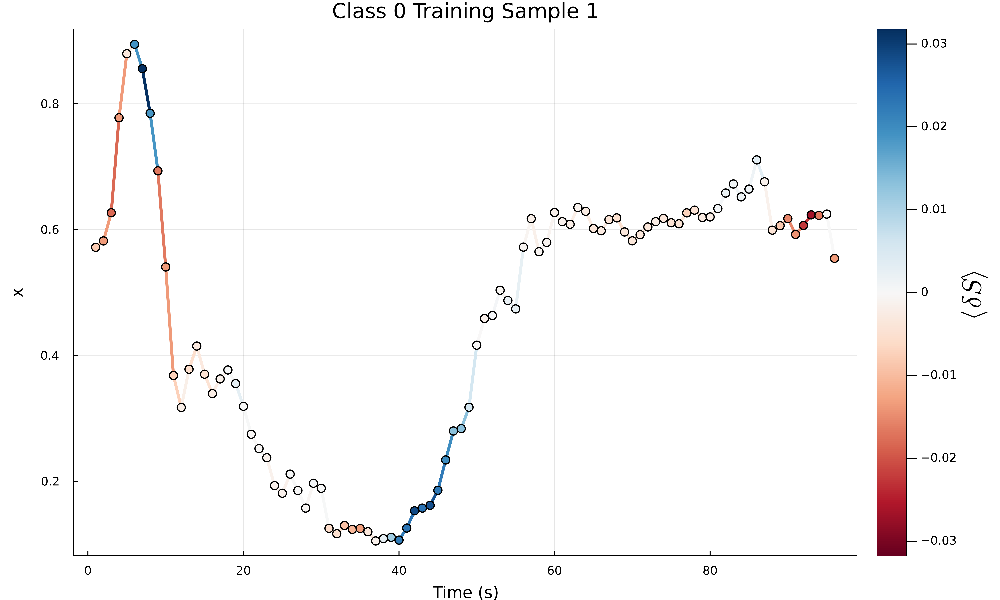

In [384]:
plot(training_sample_1, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_1, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_1, 
    marker_z=average_variations_sample_1,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 0 Training Sample 1")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-0-sample-1-MPS-state1.png")

In [385]:
mps_state_1 = deepcopy(W);
decision_idx = findindex(mps_state_1[1], "decision")
decision_state_1 = onehot(decision_idx => (2))
mps_state_1[1] *= decision_state_1
normalize!(mps_state_1);

In [386]:
training_sample_2 = X_train_normalised[3, :]
ϕ2 = GenerateSingleProductState(training_sample_2, sites);

In [387]:
average_variations_sample_2 = [ComputeAverageVariation(i, mps_state_1, ϕ2, sites) for i=1:length(mps_state_1)]

96-element Vector{Float64}:
 NaN
  -0.01722572055771662
  -0.02293613104423631
  -0.01877931427505217
  -0.009256856844428323
   0.011463276413430612
   0.02613482169201268
   0.021755433319616182
  -0.017843788271938284
  -0.014701188084393328
   ⋮
  -0.004459672739842971
  -0.009234411448781576
  -0.015560476576429286
  -0.01457295202617198
  -0.02295620789650273
  -0.028043258922864054
  -0.016717192123198003
  -0.025096246759890518
  -0.010541247542229307

In [389]:
replace!(average_variations_sample_2, NaN => 0.0)

96-element Vector{Float64}:
  0.0
 -0.01722572055771662
 -0.02293613104423631
 -0.01877931427505217
 -0.009256856844428323
  0.011463276413430612
  0.02613482169201268
  0.021755433319616182
 -0.017843788271938284
 -0.014701188084393328
  ⋮
 -0.004459672739842971
 -0.009234411448781576
 -0.015560476576429286
 -0.01457295202617198
 -0.02295620789650273
 -0.028043258922864054
 -0.016717192123198003
 -0.025096246759890518
 -0.010541247542229307

In [390]:
cmax = maximum(abs.(average_variations_sample_2))

0.028878566234783253

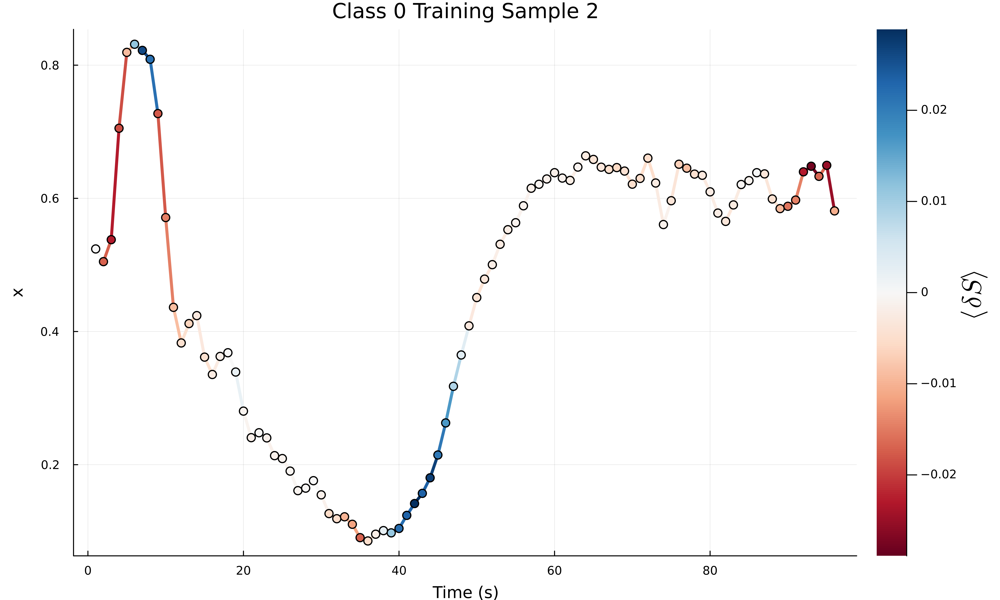

In [393]:
plot(training_sample_2, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_2, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_2, 
    marker_z=average_variations_sample_2,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 0 Training Sample 2")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-0-sample-2-MPS-state1.png")

In [394]:
mps_state_1 = deepcopy(W);
decision_idx = findindex(mps_state_1[1], "decision")
decision_state_1 = onehot(decision_idx => (2))
mps_state_1[1] *= decision_state_1
normalize!(mps_state_1);

In [395]:
training_sample_3 = X_train_normalised[98, :]
ϕ3 = GenerateSingleProductState(training_sample_3, sites);

In [396]:
average_variations_sample_3 = [ComputeAverageVariation(i, mps_state_1, ϕ3, sites) for i=1:length(mps_state_1)]

96-element Vector{Float64}:
 NaN
  -0.014565868041060628
  -0.016578952534679604
  -0.01055897120513418
  -0.0024591016645974296
   0.011103952411626967
   0.008741404751490428
  -0.010663199277200339
  -0.02066725077256188
  -0.01268637493703365
   ⋮
  -0.007929800598704474
  -0.01186306698177423
  -0.016419472277604444
  -0.018003399691251067
  -0.025188931160285016
  -0.024997747235141837
  -0.02472633048750713
  -0.053945057922366466
  -0.01634635438055459

In [397]:
replace!(average_variations_sample_3, NaN => 0.0)

96-element Vector{Float64}:
  0.0
 -0.014565868041060628
 -0.016578952534679604
 -0.01055897120513418
 -0.0024591016645974296
  0.011103952411626967
  0.008741404751490428
 -0.010663199277200339
 -0.02066725077256188
 -0.01268637493703365
  ⋮
 -0.007929800598704474
 -0.01186306698177423
 -0.016419472277604444
 -0.018003399691251067
 -0.025188931160285016
 -0.024997747235141837
 -0.02472633048750713
 -0.053945057922366466
 -0.01634635438055459

In [398]:
cmax = maximum(abs.(average_variations_sample_3))

0.053945057922366466

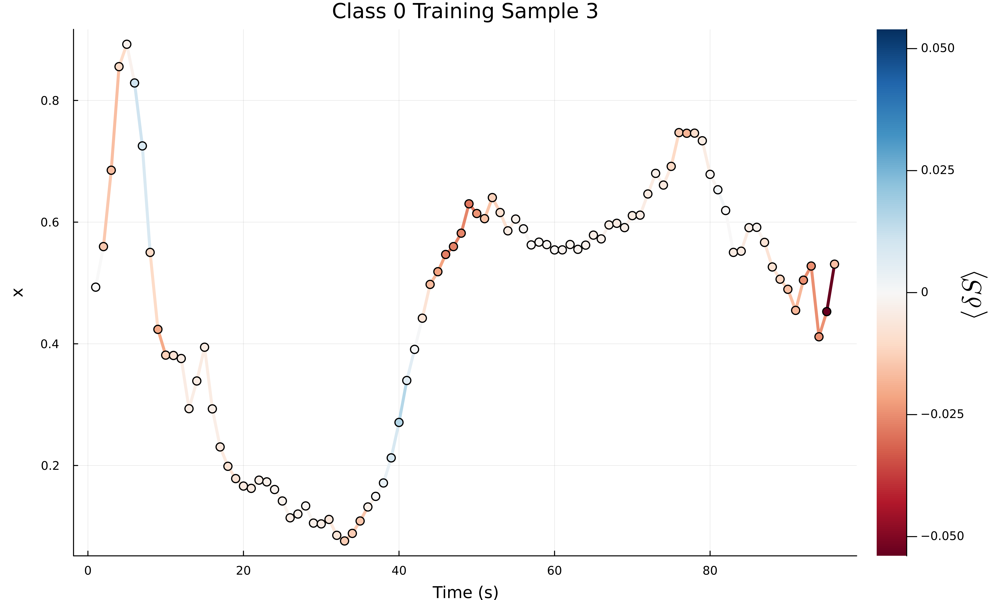

In [401]:
plot(training_sample_3, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_3, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_3, 
    marker_z=average_variations_sample_3,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 0 Training Sample 3")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-0-sample-3-MPS-state1.png")

In [402]:
mps_state_1 = deepcopy(W);
decision_idx = findindex(mps_state_1[1], "decision")
decision_state_1 = onehot(decision_idx => (2))
mps_state_1[1] *= decision_state_1
normalize!(mps_state_1);

In [403]:
training_sample_4 = X_train_normalised[19, :]
ϕ4 = GenerateSingleProductState(training_sample_4, sites);

In [404]:
average_variations_sample_4 = [ComputeAverageVariation(i, mps_state_1, ϕ4, sites) for i=1:length(mps_state_1)]

96-element Vector{Float64}:
 -0.00014668253629485418
 -0.0076769792359506995
 -0.0158534567259776
 -0.015804971056239986
 -0.012890835138331676
  0.009892961400195997
  0.01133714507725137
 -0.013208953408509113
 -0.024416134290196966
 -0.01546433615990788
  ⋮
 -0.004751654091829566
 -0.009274053698936757
 -0.016919926828629726
 -0.031014228282010208
 -0.04794812847984878
 -0.05354896605158705
 -0.014809861717098879
 -0.0100132671572852
 -0.014684706471855153

In [406]:
replace!(average_variations_sample_4, NaN => 0.0)

96-element Vector{Float64}:
 -0.00014668253629485418
 -0.0076769792359506995
 -0.0158534567259776
 -0.015804971056239986
 -0.012890835138331676
  0.009892961400195997
  0.01133714507725137
 -0.013208953408509113
 -0.024416134290196966
 -0.01546433615990788
  ⋮
 -0.004751654091829566
 -0.009274053698936757
 -0.016919926828629726
 -0.031014228282010208
 -0.04794812847984878
 -0.05354896605158705
 -0.014809861717098879
 -0.0100132671572852
 -0.014684706471855153

In [407]:
cmax = maximum(abs.(average_variations_sample_4))

0.05354896605158705

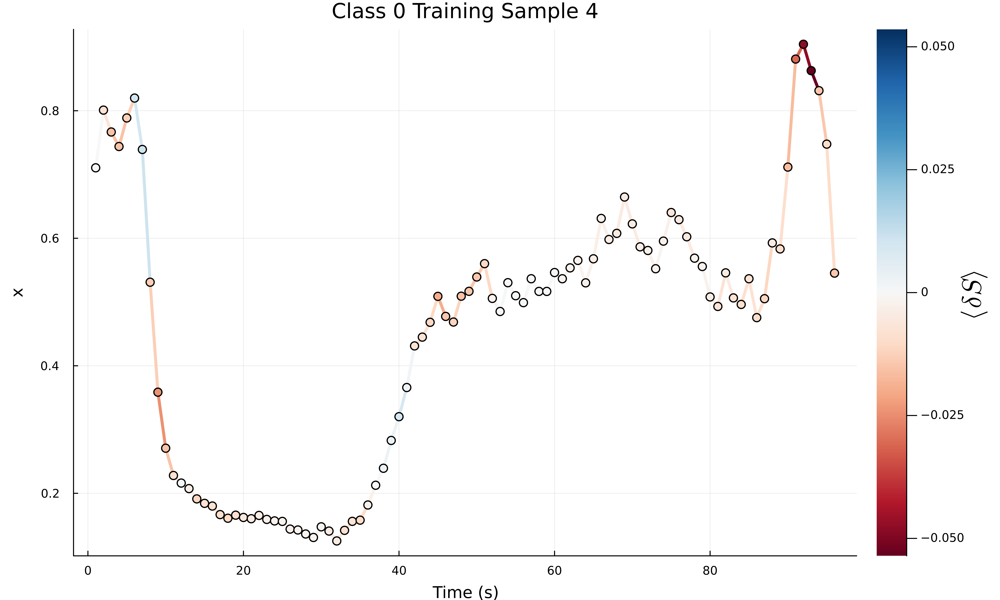

In [410]:
plot(training_sample_4, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_4, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_4, 
    marker_z=average_variations_sample_4,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 0 Training Sample 4")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-0-sample-4-MPS-state1.png")

### Class 1 Samples

In [411]:
mps_state_1 = deepcopy(W);
decision_idx = findindex(mps_state_1[1], "decision")
decision_state_1 = onehot(decision_idx => (2))
mps_state_1[1] *= decision_state_1
normalize!(mps_state_1);

In [413]:
training_sample_5 = X_train_normalised[5, :]
ϕ5 = GenerateSingleProductState(training_sample_5, sites);

In [414]:
average_variations_sample_5 = [ComputeAverageVariation(i, mps_state_1, ϕ5, sites) for i=1:length(mps_state_1)]

96-element Vector{Float64}:
 -0.006081201916430857
 -0.011711252911119975
 -0.019266777137307116
 -0.010108229980785139
 -0.00362328736079766
 -0.03467219096178955
 -0.06258309439303503
  0.0010173058799650622
 -0.016396794172347105
 -0.016820111447465123
  ⋮
 -0.014322301040945772
 -0.01866461451650638
 -0.018113602353793907
 -0.019949488930022102
 -0.03530871674835219
 -0.03317594172664257
 -0.02945357963353174
 -0.04364529645760339
 -0.00928713600429391

In [415]:
replace!(average_variations_sample_5, NaN => 0.0)

96-element Vector{Float64}:
 -0.006081201916430857
 -0.011711252911119975
 -0.019266777137307116
 -0.010108229980785139
 -0.00362328736079766
 -0.03467219096178955
 -0.06258309439303503
  0.0010173058799650622
 -0.016396794172347105
 -0.016820111447465123
  ⋮
 -0.014322301040945772
 -0.01866461451650638
 -0.018113602353793907
 -0.019949488930022102
 -0.03530871674835219
 -0.03317594172664257
 -0.02945357963353174
 -0.04364529645760339
 -0.00928713600429391

In [416]:
cmax = maximum(abs.(average_variations_sample_5))

0.07292854064644326

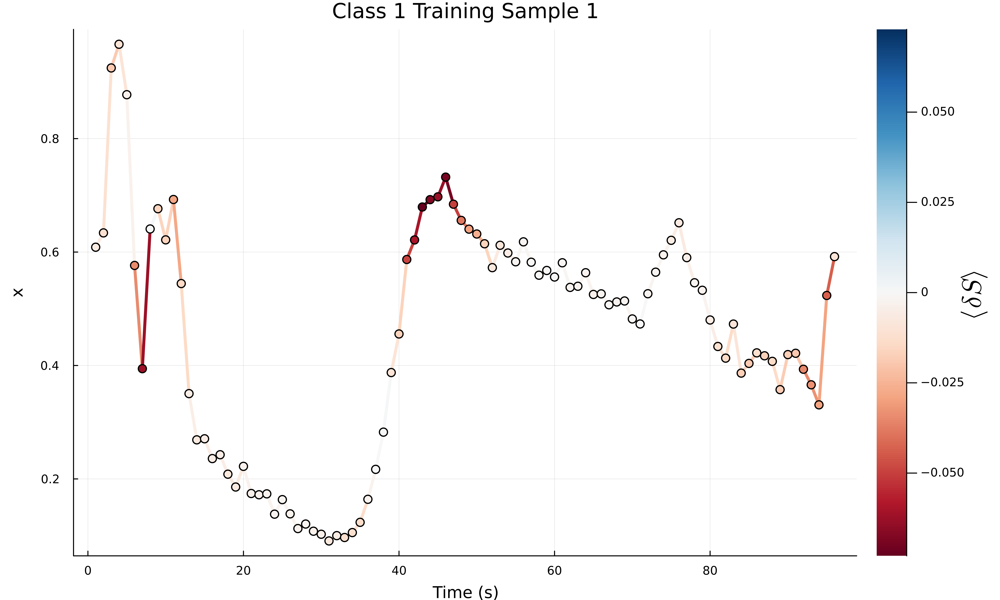

In [420]:
plot(training_sample_5, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_5, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_5, 
    marker_z=average_variations_sample_5,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 1 Training Sample 1")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-1-sample-1-MPS-state1.png")

In [421]:
mps_state_1 = deepcopy(W);
decision_idx = findindex(mps_state_1[1], "decision")
decision_state_1 = onehot(decision_idx => (2))
mps_state_1[1] *= decision_state_1
normalize!(mps_state_1);

In [423]:
training_sample_6 = X_train_normalised[9, :]
ϕ6 = GenerateSingleProductState(training_sample_6, sites);

In [424]:
average_variations_sample_6 = [ComputeAverageVariation(i, mps_state_1, ϕ6, sites) for i=1:length(mps_state_1)]

96-element Vector{Float64}:
  -0.011047475766517805
 NaN
  -0.019147690728822227
  -0.009939418792348994
  -0.010264212708581726
  -0.08691094041967123
  -0.14652794759247548
  -0.04784013465985817
  -0.020855950012176456
  -0.012416116941489036
   ⋮
  -0.010948329056187521
  -0.015084181427162231
  -0.016739772092188195
  -0.017851758062730337
  -0.03136550087401927
  -0.027838004623592136
  -0.023220374446155895
 NaN
  -0.01944303372426557

In [426]:
replace!(average_variations_sample_6, NaN => 0.0)

96-element Vector{Float64}:
 -0.011047475766517805
  0.0
 -0.019147690728822227
 -0.009939418792348994
 -0.010264212708581726
 -0.08691094041967123
 -0.14652794759247548
 -0.04784013465985817
 -0.020855950012176456
 -0.012416116941489036
  ⋮
 -0.010948329056187521
 -0.015084181427162231
 -0.016739772092188195
 -0.017851758062730337
 -0.03136550087401927
 -0.027838004623592136
 -0.023220374446155895
  0.0
 -0.01944303372426557

In [427]:
cmax = maximum(abs.(average_variations_sample_6))

0.14652794759247548

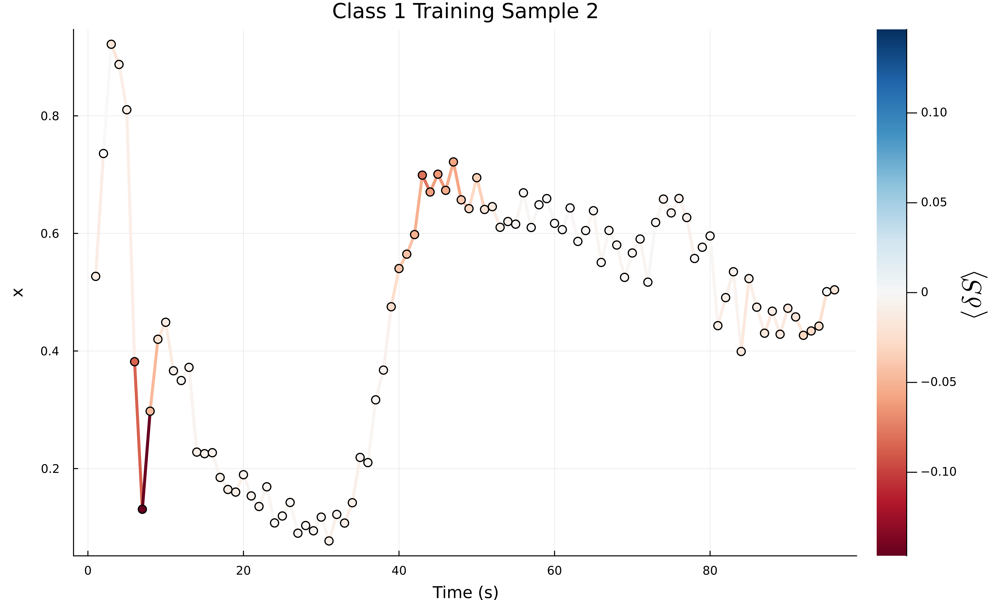

In [430]:
plot(training_sample_6, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_6, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_6, 
    marker_z=average_variations_sample_6,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 1 Training Sample 2")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-1-sample-2-MPS-state1.png")

In [431]:
mps_state_1 = deepcopy(W);
decision_idx = findindex(mps_state_1[1], "decision")
decision_state_1 = onehot(decision_idx => (2))
mps_state_1[1] *= decision_state_1
normalize!(mps_state_1);

In [432]:
training_sample_7 = X_train_normalised[98, :]
ϕ7 = GenerateSingleProductState(training_sample_7, sites);

In [433]:
average_variations_sample_7 = [ComputeAverageVariation(i, mps_state_1, ϕ7, sites) for i=1:length(mps_state_1)]

96-element Vector{Float64}:
 NaN
  -0.014565868041060628
  -0.016578952534679604
  -0.01055897120513418
  -0.0024591016645974296
   0.011103952411626967
   0.008741404751490428
  -0.010663199277200339
  -0.02066725077256188
  -0.01268637493703365
   ⋮
  -0.007929800598704474
  -0.01186306698177423
  -0.016419472277604444
  -0.018003399691251067
  -0.025188931160285016
  -0.024997747235141837
  -0.02472633048750713
  -0.053945057922366466
  -0.01634635438055459

In [434]:
replace!(average_variations_sample_7, NaN => 0.0)

96-element Vector{Float64}:
  0.0
 -0.014565868041060628
 -0.016578952534679604
 -0.01055897120513418
 -0.0024591016645974296
  0.011103952411626967
  0.008741404751490428
 -0.010663199277200339
 -0.02066725077256188
 -0.01268637493703365
  ⋮
 -0.007929800598704474
 -0.01186306698177423
 -0.016419472277604444
 -0.018003399691251067
 -0.025188931160285016
 -0.024997747235141837
 -0.02472633048750713
 -0.053945057922366466
 -0.01634635438055459

In [435]:
cmax = maximum(abs.(average_variations_sample_7))

0.053945057922366466

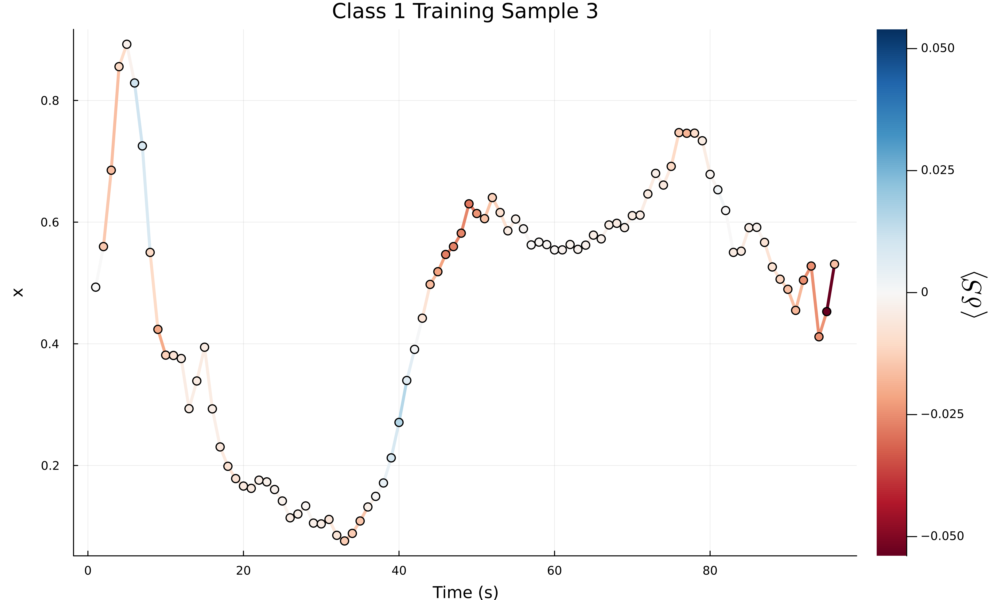

In [438]:
plot(training_sample_7, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_7, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_7, 
    marker_z=average_variations_sample_7,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 1 Training Sample 3")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-1-sample-3-MPS-state1.png")

In [439]:
mps_state_1 = deepcopy(W);
decision_idx = findindex(mps_state_1[1], "decision")
decision_state_1 = onehot(decision_idx => (2))
mps_state_1[1] *= decision_state_1
normalize!(mps_state_1);

In [440]:
training_sample_8 = X_train_normalised[99, :]
ϕ8 = GenerateSingleProductState(training_sample_8, sites);

In [441]:
average_variations_sample_8 = [ComputeAverageVariation(i, mps_state_1, ϕ8, sites) for i=1:length(mps_state_1)]

96-element Vector{Float64}:
 -0.013510449699210381
 -0.009755048136835514
 -0.017021300157418158
 -0.009720472175408409
 -0.009385834076189205
 -0.07629385779296996
 -0.14557459026000288
 -0.053254888516012656
 -0.018043054810204653
 -0.01246477350727376
  ⋮
 -0.00786653561577437
 -0.013246108120253125
 -0.015642768227431925
 -0.014573129606693713
 -0.02690247908879197
 -0.02506497756309519
 -0.021524592296323895
 -0.048230553262038685
 -0.01312445603183149

In [442]:
replace!(average_variations_sample_8, NaN => 0.0)

96-element Vector{Float64}:
 -0.013510449699210381
 -0.009755048136835514
 -0.017021300157418158
 -0.009720472175408409
 -0.009385834076189205
 -0.07629385779296996
 -0.14557459026000288
 -0.053254888516012656
 -0.018043054810204653
 -0.01246477350727376
  ⋮
 -0.00786653561577437
 -0.013246108120253125
 -0.015642768227431925
 -0.014573129606693713
 -0.02690247908879197
 -0.02506497756309519
 -0.021524592296323895
 -0.048230553262038685
 -0.01312445603183149

In [443]:
cmax = maximum(abs.(average_variations_sample_8))

0.14557459026000288

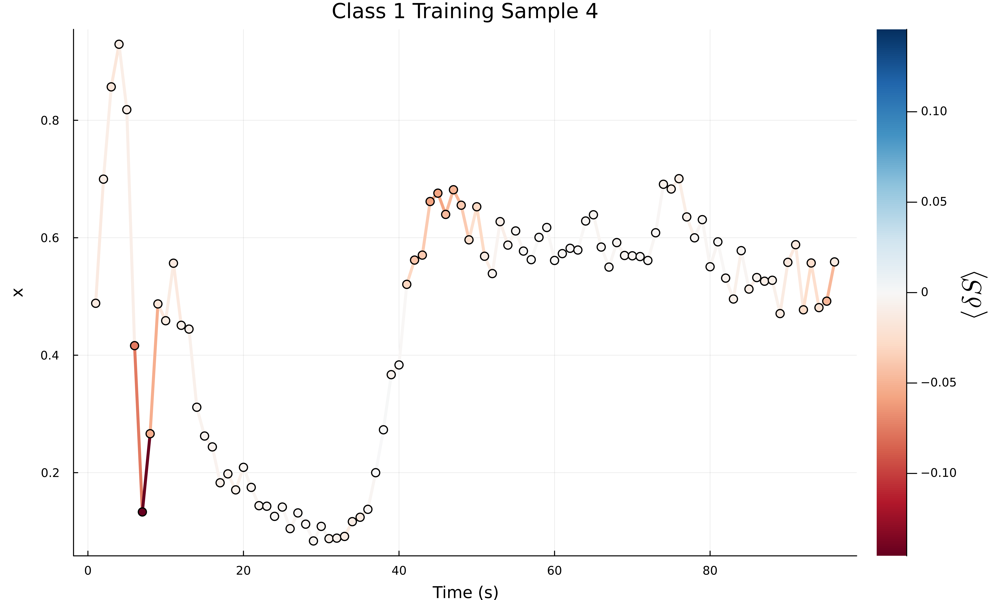

In [446]:
plot(training_sample_8, color=:black, 
    linewidth=3, 
    label="", 
    line_z=average_variations_sample_8, 
    size=(1000, 600), 
    colormap=:RdBu, 
    colorbar_title=L"\langle \delta S \rangle",
    colorbar_titlefontsize=18,
    dpi=800)
scatter!(training_sample_8, 
    marker_z=average_variations_sample_8,
    colormap=:RdBu, 
    ms=4.5, 
    left_margin=5mm,
    right_margin=5mm, 
    label="", 
    clim=(-cmax, cmax))
title!("Class 1 Training Sample 4")
xlabel!("Time (s)")
ylabel!("x")
#savefig("class-1-sample-4-MPS-state1.png")

# Class-wise?

In [447]:
mps_state_0 = deepcopy(W);
decision_idx = findindex(mps_state_0[1], "decision")
decision_state_0 = onehot(decision_idx => (1))
mps_state_0[1] *= decision_state_0
normalize!(mps_state_0);

In [450]:
# now we loop through each training sample, compute our variation
class_0_idxs = findall(x -> x.== 0, y_train[:,1]);

In [451]:
per_sample_av_var = []
for sample_idx in class_0_idxs
    training_sample = X_train_normalised[sample_idx, :]
    ϕ = GenerateSingleProductState(training_sample, sites);
    average_variations_sample = [ComputeAverageVariation(i, mps_state_0, ϕ, sites) for i=1:length(mps_state_0)]
    push!(per_sample_av_var, average_variations_sample)
end
    

In [458]:
per_sample_av_var[2]

96-element Vector{Float64}:
   0.008607413429567348
 NaN
  -0.011480718584235227
  -0.028689968653679856
  -0.06387131023375078
  -0.06368767318123128
  -0.03603058729821395
  -0.023117161446563565
  -0.018171356691140873
  -0.005593224181603946
   ⋮
  -0.007500525906392008
  -0.008599277535239463
  -0.02146511485596603
  -0.022291490280936774
  -0.02640500058784979
  -0.025595280209529968
  -0.02190227372419928
  -0.04629616091492699
  -0.024068825542191752

In [500]:
per_sample_av_var


31-element Vector{Any}:
 [0.0008438680012057811, 0.002913697568342576, -0.022701519851804314, -0.0409949811394141, -0.07480861118132533, -0.07413317037504932, -0.03899044645371034, -0.021316130310512903, -0.01590594526060774, -0.006057973014150627  …  -0.0063670893114779374, -0.007500377909791872, -0.007206991368827075, -0.019488777372754645, -0.022637304464115486, -0.028951901682163987, -0.027816103931354107, -0.021796416409482468, -0.043544209942794634, -0.020952563949041485]
 [0.008607413429567348, 0.0, -0.011480718584235227, -0.028689968653679856, -0.06387131023375078, -0.06368767318123128, -0.03603058729821395, -0.023117161446563565, -0.018171356691140873, -0.005593224181603946  …  -0.007116497354198113, -0.007500525906392008, -0.008599277535239463, -0.02146511485596603, -0.022291490280936774, -0.02640500058784979, -0.025595280209529968, -0.02190227372419928, -0.04629616091492699, -0.024068825542191752]
 [-0.025031117478059268, -0.04742900899873591, -0.05303955976415339, -0.046277

In [511]:
sum_all = per_sample_av_var[1]
for i=2:31
    sum_all .+= per_sample_av_var[i]
end

In [512]:
average_class_0 = sum_all ./ 31

96-element Vector{Float64}:
 -0.007141577240649186
 -0.016822715146483414
 -0.04275197343716458
 -0.04449115606582476
 -0.05378618610453253
 -0.04661268951070955
 -0.02737997003936456
 -0.01684657995811318
 -0.019250821922336975
 -0.013451536502720475
  ⋮
 -0.0076266441615149595
 -0.010835030130629152
 -0.023470175847676713
 -0.023786009793524417
 -0.029836030953825764
 -0.03202378034106163
 -0.023783232445170156
 -0.03508429033036878
 -0.017414933182787414

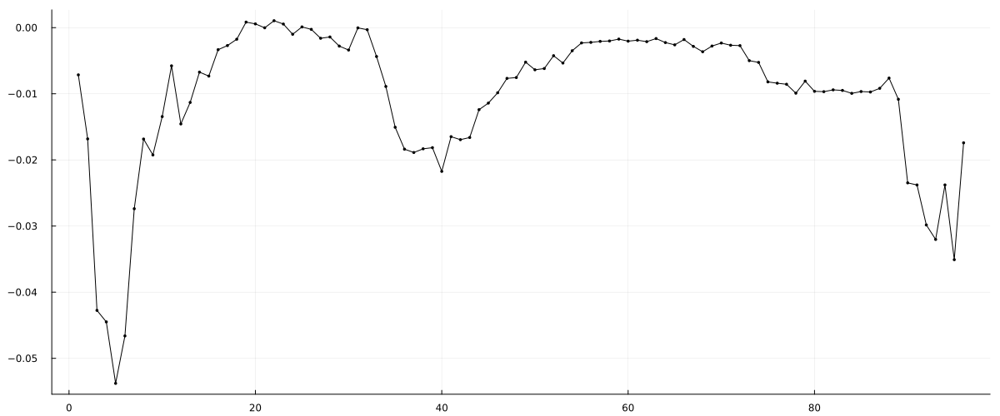

In [520]:
plot(average_class_0, label="", size=(1200, 500), color=:black)
scatter!(average_class_0, label="", ms=2, color=:black)
